# Try to use Siamese neural net to distinguish art style


Face's proportions are differents depending the style of the statue
- Use a Siamese neural net to reconize 2 representations of buddha of a same style as a same person; and 2 statue from a different style as different persons

In [1]:
import pandas as pd
import os
from PIL import Image
import numpy as np
from math import floor
from keras.optimizers import RMSprop

Using TensorFlow backend.


In [2]:
dataPath = "D:/Project/DeepLearning/buddhaStyle/Data/workData/"

In [3]:
os.chdir(dataPath)

In [4]:
picsStyle = ["Dvaravati%20Period_18.jpg","Lanna%20Kingdom_958.jpg","Sukhothai%20Period_659.jpg", "Uthong%20Art_950.jpg","Lopburi%20Period_300.jpg","Srivichai%20Kingdom_985.jpg"]

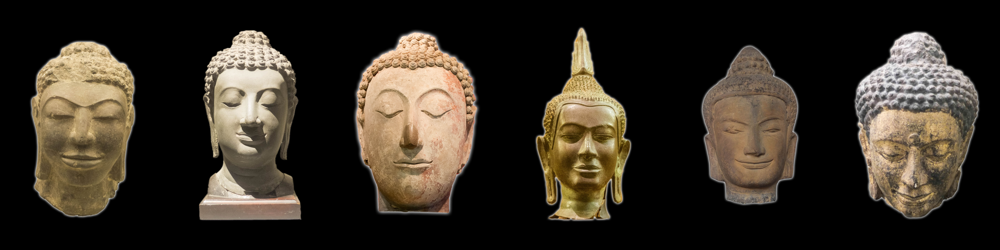

In [5]:
imgs    = [ Image.open(i) for i in picsStyle ]
img = np.asarray(imgs[0])
for i in imgs[1:]:
    ii = np.asarray(i)
    img = np.concatenate((img,ii), axis = 1 )
Image.fromarray(img)

## Load the data

In [7]:
def loadData(train,path,nSize):
    ''' This function return a 3 numpy arrays from the text file.
    arguments: train, the name of the text file
    path: pictures directory's path
    nSize (integer): output size
    '''
    def resizenCrop(imgPath,nSize):
        '''This function resize then crop a picture and return it as numpy array'''
        img = Image.open(imgPath)
        
        h = img.height
        w = img.width

        #resize the picture with original ratio
        if h <= w:
            img = img.resize(( floor( nSize * w / h ), nSize  ), Image.ANTIALIAS)
        else:
            img = img.resize((nSize,  floor(nSize *  h / w) ), Image.ANTIALIAS)

        #Crop the picture; keep the center of the picture         
        left = (img.width - nSize)/2
        top = (img.height - nSize)/2
        right = (img.width + nSize)/2
        bottom = (img.height + nSize)/2
        img = img.crop((left, top, right, bottom))
        
        return( np.asarray(img).flatten() )


   
    tr = open(path + train,'r')
    data = tr.readlines()
    tr.close()
    
    x1 = []
    x2 = []
    y = []
    
    for d in data[1:]:
        z = d.split(',')
        
        ph1 =  Image.open(z[0])
        ph2 = Image.open(z[1])
        
        
        
        x1.append( resizenCrop(path + z[0], 256 )  )
        x2.append( resizenCrop(path + z[1], 256 )  )
        y.append(z[2])
        
    x1 = np.asarray(x1).flatten().reshape(-1,256,256,3)
    x2 = np.asarray(x2).flatten().reshape(-1,256,256,3)
    y = np.asarray(y).flatten()
        
        
    
    return(x1,x2,y)
    
    

In [8]:
x1,x2, y = loadData("train.txt",dataPath,256)

In [9]:
x1test , x2test, ytest = loadData("test.txt",dataPath,256)

## Create a model

Inspired from: https://keras.io/examples/mnist_siamese/

In [10]:
from keras.layers import Conv2D, MaxPooling2D, Dense, Concatenate, Flatten, Lambda, Dropout, Input
from keras.models import Model
from keras import backend as K
from keras.applications.vgg16 import VGG16
from keras.utils import plot_model

### Loss function

In [11]:
def euclidean_distance(vects):
    '''Distance between the 2 vectors'''
    x, y = vects
    sum_square = K.sum(K.square(x - y), axis=1, keepdims=True)
    return K.sqrt(K.maximum(sum_square, K.epsilon()))

def eucl_dist_output_shape(shapes):
    shape1, shape2 = shapes
    return (shape1[0], 1)


def contrastive_loss(y_true, y_pred):
    '''Contrastive loss from Hadsell-et-al.'06
    http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    '''
    margin = 1
    sqaure_pred = K.square(y_pred)
    margin_square = K.square(K.maximum(margin - y_pred, 0))
    return K.mean(y_true * sqaure_pred + (1 - y_true) * margin_square)

def compute_accuracy(y_true, y_pred):
    '''Compute classification accuracy with a fixed threshold on distances.
    '''
    pred = y_pred.ravel() < 0.5
    return np.mean(pred == y_true)

def accuracy(y_true, y_pred):
    '''Compute classification accuracy with a fixed threshold on distances.
    '''
    return K.mean(K.equal(y_true, K.cast(y_pred < 0.5, y_true.dtype)))


### Base Model

Create a siamese neural net with a VGG16 base

In [12]:
def baseModel():
    '''Function returning the base model'''
    v16 = VGG16(include_top=False, weights='imagenet', input_tensor=None, input_shape=(256,256,3), pooling='none', classes=1000)
    
    x = v16.get_layer('block4_pool').output
    x = Flatten()(x)
    x = Dropout(.2)(x)
    x = Dense(256, activation='relu')(x)
    x = Dense(128, activation='relu')(x)
    x = Dense(64, activation='relu')(x)
    return Model(v16.input,x)

In [13]:
base1 = baseModel()
base2 = baseModel()

In [14]:
#rename the base2 layers to avoid the error :  'All layer names should be unique.'
for layer in base2.layers:
    layer.name = layer.name + '2'

### Siamese model

In [15]:
distance = Lambda(euclidean_distance,output_shape=eucl_dist_output_shape)([base1.output, base2.output])

In [16]:
siameseModel = Model([base1.input, base2.input],distance)

In [17]:
siameseModel.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
input_22 (InputLayer)           (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv12 (Conv2D)          (None, 256, 256, 64) 1792        input_22[0][0]                   
__________________________________________________________________________________________________
block1_con

In [18]:
plot_model(siameseModel,'D:/Project/DeepLearning/buddhaStyle/Models/siamese/siameseModel.png')

## Training

In [19]:
from keras.callbacks import TensorBoard
tbd = TensorBoard("D:/Project/DeepLearning/buddhaStyle/Output/siamese/")

In [20]:
rms = RMSprop()
siameseModel.compile(loss=contrastive_loss, optimizer=rms, metrics=[accuracy] )
siameseModel.fit([ x1,x2], y  ,batch_size=5,epochs=15,validation_data=([x1test , x2test], ytest) ,callbacks=[tbd] )

Train on 2969 samples, validate on 658 samples
Epoch 1/15
2969/2969 [==============================] - 425s 143ms/step - loss: 191412786.5521 - accuracy: 0.6797 - val_loss: 0.1451 - val_accuracy: 0.8419
Epoch 2/15
2969/2969 [==============================] - 432s 146ms/step - loss: 7.0729 - accuracy: 0.6682 - val_loss: 0.1297 - val_accuracy: 0.8632
Epoch 3/15
2969/2969 [==============================] - 430s 145ms/step - loss: 16.1687 - accuracy: 0.7228 - val_loss: 0.2173 - val_accuracy: 0.7675
Epoch 4/15
2969/2969 [==============================] - 424s 143ms/step - loss: 16.0267 - accuracy: 0.7481 - val_loss: 0.3649 - val_accuracy: 0.1368
Epoch 5/15
2969/2969 [==============================] - 422s 142ms/step - loss: 1.0713 - accuracy: 0.7511 - val_loss: 0.1430 - val_accuracy: 0.8632
Epoch 6/15
2969/2969 [==============================] - 422s 142ms/step - loss: 4.3331 - accuracy: 0.7609 - val_loss: 0.1273 - val_accuracy: 0.8632
Epoch 7/15
2969/2969 [==============================] -

## Save the model

In [24]:
epoch = 15

if not os.path.isdir('D:/Project/DeepLearning/buddhaStyle/Models/siamese/vgg16/{}'.format(epoch)):
    os.mkdir('D:/Project/DeepLearning/buddhaStyle/Models/siamese/vgg16/{}'.format(epoch))

siameseModel.save('D:/Project/DeepLearning/buddhaStyle/Models/siamese/vgg16/{}/vgg16_{}.h5'.format(epoch,epoch))